#Dataset

##Loading the Dataset:

In [1]:
import pandas as pd

# Read the individual CSV files
btc_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_Bitcoin.csv")
eth_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_Ethereum.csv")
xrp_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_XRP.csv")
ltc_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_Litecoin.csv")
usdc_df = pd.read_csv("https://raw.githubusercontent.com/Amarpreet3/CIND-820-CAPSTONE/main/Dataset/coin_USDCoin.csv")

# Concatenate the datasets vertically
df = pd.concat([btc_df, eth_df, xrp_df, ltc_df, usdc_df])

# Save the merged dataset to a new CSV file
df.to_csv("cryptocurrency.csv", index=False)



#EDA

##Loading packages 

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn import tree
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn import metrics
import seaborn as sns
%matplotlib inline

In [3]:
import sys
!{sys.executable} -m pip install -U pandas-profiling
!jupyter nbextension enable --py widgetsnbextension
!pip install matplotlib
!pip install graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.3/352.3 kB 18.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 31.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=198a2f801c809760c70def3e4b378017f59e1d149e1904b1dd850e34e3c59272
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attemp

##Data Description

In [4]:
print(type(df))

<class 'pandas.core.frame.DataFrame'>


In [5]:
df.head()

,SNo,Name,Symbol,Date,High,Low,Open,Close,Volume,Marketcap
0,1,Bitcoin,BTC,2013-04-29 23:59:59,147.488007,134.000000,134.444000,144.539993,0.0,1.603769e+09
1,2,Bitcoin,BTC,2013-04-30 23:59:59,146.929993,134.050003,144.000000,139.000000,0.0,1.542813e+09
2,3,Bitcoin,BTC,2013-05-01 23:59:59,139.889999,107.720001,139.000000,116.989998,0.0,1.298955e+09
3,4,Bitcoin,BTC,2013-05-02 23:59:59,125.599998,92.281898,116.379997,105.209999,0.0,1.168517e+09
4,5,Bitcoin,BTC,2013-05-03 23:59:59,108.127998,79.099998,106.250000,97.750000,0.0,1.085995e+09


In [6]:
df.tail()

,SNo,Name,Symbol,Date,High,Low,Open,Close,Volume,Marketcap
997,998,USD Coin,USDC,2021-07-02 23:59:59,1.000916,0.999966,1.000177,1.000035,1.787896e+09,2.539775e+10
998,999,USD Coin,USDC,2021-07-03 23:59:59,1.000670,0.999925,1.000048,0.999984,1.491017e+09,2.550437e+10
999,1000,USD Coin,USDC,2021-07-04 23:59:59,1.000187,0.998901,0.999956,0.999500,1.578667e+09,2.551172e+10
1000,1001,USD Coin,USDC,2021-07-05 23:59:59,1.000839,0.999459,0.999565,1.000528,1.887496e+09,2.554724e+10
1001,1002,USD Coin,USDC,2021-07-06 23:59:59,1.000731,0.999662,1.000501,1.000059,2.312602e+09,2.567322e+10


In [7]:
df.Name.unique()

array(['Bitcoin', 'Ethereum', 'XRP', 'Litecoin', 'USD Coin'], dtype=object)

In [8]:
df.Symbol.unique()

array(['BTC', 'ETH', 'XRP', 'LTC', 'USDC'], dtype=object)

In [9]:
df.columns

Index(['SNo', 'Name', 'Symbol', 'Date', 'High', 'Low', 'Open', 'Close',
       'Volume', 'Marketcap'],
      dtype='object')

In [10]:
df[['Name', 'Symbol']].value_counts()

Name      Symbol
Bitcoin   BTC       2991
Litecoin  LTC       2991
XRP       XRP       2893
Ethereum  ETH       2160
USD Coin  USDC      1002
dtype: int64

In [11]:
df['Name'].value_counts()

Bitcoin     2991
Litecoin    2991
XRP         2893
Ethereum    2160
USD Coin    1002
Name: Name, dtype: int64

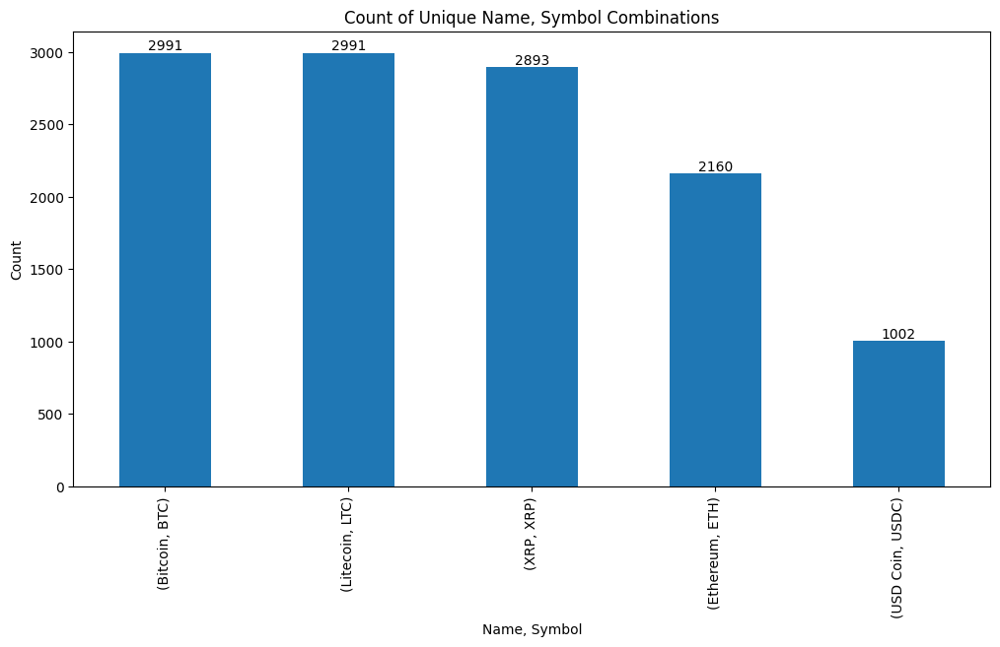

In [12]:
import matplotlib.pyplot as plt

counts = df[['Name', 'Symbol']].value_counts()

# Plotting the bar chart
plt.figure(figsize=(12, 6))
ax = counts.plot(kind='bar')
plt.xlabel('Name, Symbol')
plt.ylabel('Count')
plt.title('Count of Unique Name, Symbol Combinations')
plt.xticks(rotation=90)

# Labeling the height on top of each bar
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

plt.show()


In [13]:

print(df.dtypes)

SNo            int64
Name          object
Symbol        object
Date          object
High         float64
Low          float64
Open         float64
Close        float64
Volume       float64
Marketcap    float64
dtype: object


In [14]:

# Get the shape of the merged dataset
rows, columns = df.shape
print("Number of rows:", rows)
print("Number of columns:", columns)

Number of rows: 12037
Number of columns: 10


In [15]:
# Displaying the summary information
summary = df.info()
print(summary)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 12037 entries, 0 to 1001
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   SNo        12037 non-null  int64  
 1   Name       12037 non-null  object 
 2   Symbol     12037 non-null  object 
 3   Date       12037 non-null  object 
 4   High       12037 non-null  float64
 5   Low        12037 non-null  float64
 6   Open       12037 non-null  float64
 7   Close      12037 non-null  float64
 8   Volume     12037 non-null  float64
 9   Marketcap  12037 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 1.0+ MB
None


In [16]:
# Let's see meta information about numeric data, we can also see if there any extreme values
df.describe()

,SNo,High,Low,Open,Close,Volume,Marketcap
count,12037.000000,12037.000000,12037.000000,12037.000000,12037.000000,1.203700e+04,1.203700e+04
mean,1326.877627,1797.247945,1689.071077,1745.961716,1748.923766,4.652802e+09,4.082986e+10
std,836.777590,6507.990175,6085.346811,6312.961050,6319.601286,1.141572e+10,1.194340e+11
min,1.000000,0.003082,0.002802,0.002809,0.002810,0.000000e+00,0.000000e+00
25%,602.000000,1.000692,0.990570,0.999090,0.999228,5.895540e+06,3.682208e+08
50%,1255.000000,33.345750,30.523111,32.016525,32.001958,3.204215e+08,5.655924e+09
75%,2007.000000,372.767424,350.941986,360.312012,361.045990,3.146472e+09,2.090613e+10
max,2991.000000,64863.098908,62208.964366,63523.754869,63503.457930,3.509679e+11,1.186364e+12


In [17]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SNo,12037.0,1.326878e+03,8.367776e+02,1.000000,6.020000e+02,1.255000e+03,2.007000e+03,2.991000e+03
High,12037.0,1.797248e+03,6.507990e+03,0.003082,1.000692e+00,3.334575e+01,3.727674e+02,6.486310e+04
Low,12037.0,1.689071e+03,6.085347e+03,0.002802,9.905703e-01,3.052311e+01,3.509420e+02,6.220896e+04
Open,12037.0,1.745962e+03,6.312961e+03,0.002809,9.990903e-01,3.201653e+01,3.603120e+02,6.352375e+04
Close,12037.0,1.748924e+03,6.319601e+03,0.002810,9.992283e-01,3.200196e+01,3.610460e+02,6.350346e+04
Volume,12037.0,4.652802e+09,1.141572e+10,0.000000,5.895540e+06,3.204215e+08,3.146472e+09,3.509679e+11
Marketcap,12037.0,4.082986e+10,1.194340e+11,0.000000,3.682208e+08,5.655924e+09,2.090613e+10,1.186364e+12


In [18]:

# Convert the 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Group the data by each coin
grouped_df = df.groupby('Symbol')

# Calculate the date duration for each coin and describtion
for symbol, group in grouped_df:
    min_date = group['Date'].min()
    max_date = group['Date'].max()
    duration = max_date - min_date
    
    print("Coin:", symbol)
    print("Start Date:", min_date)
    print("End Date:", max_date)
    print("Date Duration:", duration)
    print(group.describe().transpose())
    print()


Coin: BTC
Start Date: 2013-04-29 23:59:59
End Date: 2021-07-06 23:59:59
Date Duration: 2990 days 00:00:00
            count          mean           std           min           25%  \
SNo        2991.0  1.496000e+03  8.635717e+02  1.000000e+00  7.485000e+02   
High       2991.0  6.893326e+03  1.164283e+04  7.456110e+01  4.361790e+02   
Low        2991.0  6.486010e+03  1.086903e+04  6.552600e+01  4.228795e+02   
Open       2991.0  6.700146e+03  1.128804e+04  6.850500e+01  4.304455e+02   
Close      2991.0  6.711290e+03  1.129814e+04  6.843100e+01  4.305695e+02   
Volume     2991.0  1.090633e+10  1.888895e+10  0.000000e+00  3.036725e+07   
Marketcap  2991.0  1.208761e+11  2.109438e+11  7.784112e+08  6.305579e+09   

                    50%           75%           max  
SNo        1.496000e+03  2.243500e+03  2.991000e+03  
High       2.387610e+03  8.733927e+03  6.486310e+04  
Low        2.178500e+03  8.289800e+03  6.220896e+04  
Open       2.269890e+03  8.569656e+03  6.352375e+04  
Close  

##Analysing Null/NAN values

In [19]:
df.isnull().sum()

SNo          0
Name         0
Symbol       0
Date         0
High         0
Low          0
Open         0
Close        0
Volume       0
Marketcap    0
dtype: int64

In [20]:
df.isnull().count()

SNo          12037
Name         12037
Symbol       12037
Date         12037
High         12037
Low          12037
Open         12037
Close        12037
Volume       12037
Marketcap    12037
dtype: int64

##Statistics Summary

In [21]:
# Display summary statistics of numeric columns
numeric_columns = df.select_dtypes(include=[int, float])
summary_statistics = numeric_columns.describe()
print("Summary Statistics:")
print(summary_statistics)

Summary Statistics:
                SNo          High           Low          Open         Close  \
count  12037.000000  12037.000000  12037.000000  12037.000000  12037.000000   
mean    1326.877627   1797.247945   1689.071077   1745.961716   1748.923766   
std      836.777590   6507.990175   6085.346811   6312.961050   6319.601286   
min        1.000000      0.003082      0.002802      0.002809      0.002810   
25%      602.000000      1.000692      0.990570      0.999090      0.999228   
50%     1255.000000     33.345750     30.523111     32.016525     32.001958   
75%     2007.000000    372.767424    350.941986    360.312012    361.045990   
max     2991.000000  64863.098908  62208.964366  63523.754869  63503.457930   

             Volume     Marketcap  
count  1.203700e+04  1.203700e+04  
mean   4.652802e+09  4.082986e+10  
std    1.141572e+10  1.194340e+11  
min    0.000000e+00  0.000000e+00  
25%    5.895540e+06  3.682208e+08  
50%    3.204215e+08  5.655924e+09  
75%    3.146472e

###Categorical to One-Hot (numeric) Encoding

In [22]:
#Let's create a list for our categorical columns
#cat_cols=["Name", "Symbol", "Date"]

In [23]:
# Create a copy of the data frame in memory with a different name
#df_onehot=df.copy()
#convert only categorical variables/features to dummy/one-hot features
#df_onehot = pd.get_dummies(df, columns=cat_cols, prefix = cat_cols)
#print the dataset
#df_onehot

##Pandas Profiling

In [24]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df)

<ipython-input-24-ce1e41813c97>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [25]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Visualizing the Data

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [27]:
#DataFrame copied to keep the original unaltered
df_visual = df.copy()

###Visulizing each attribute for selected coins - Line graph

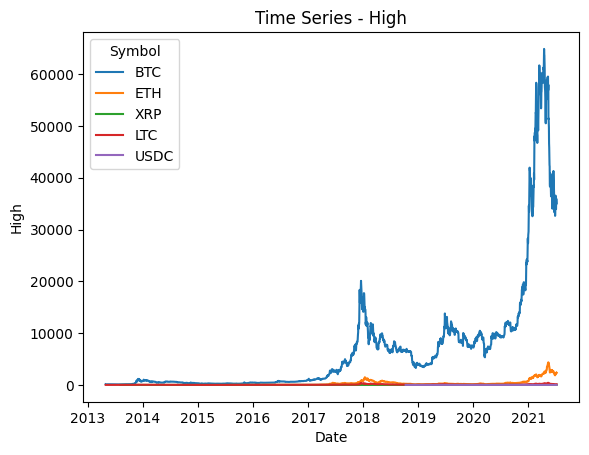

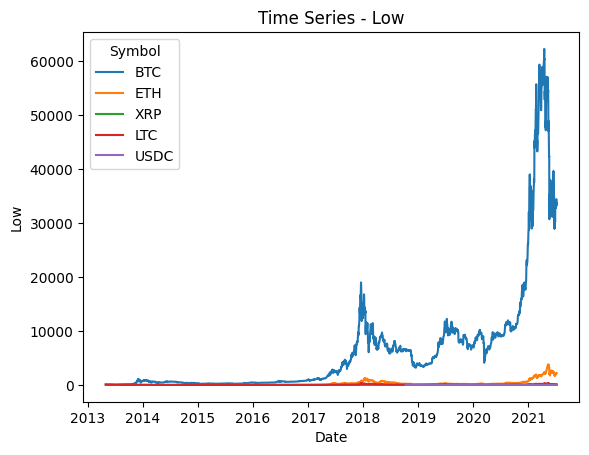

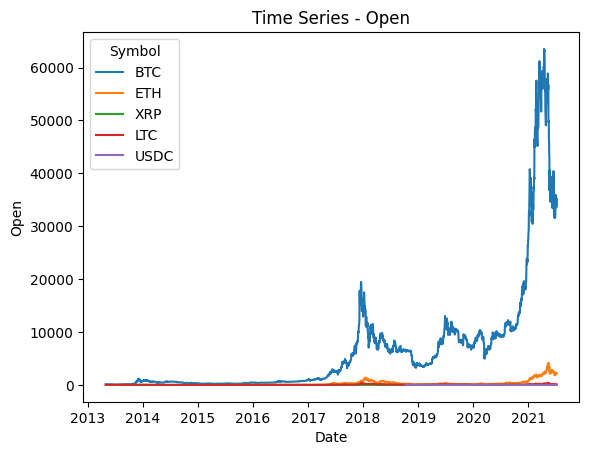

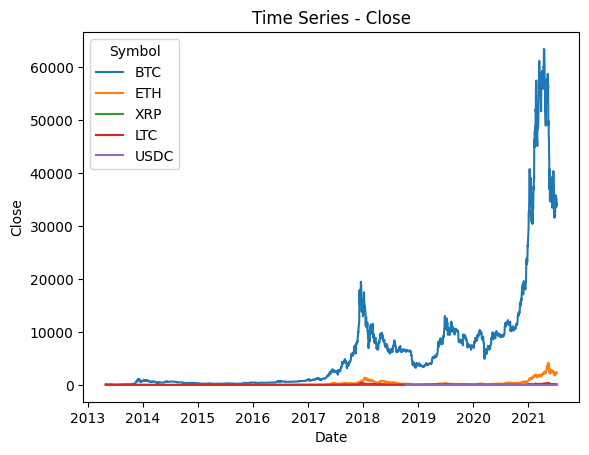

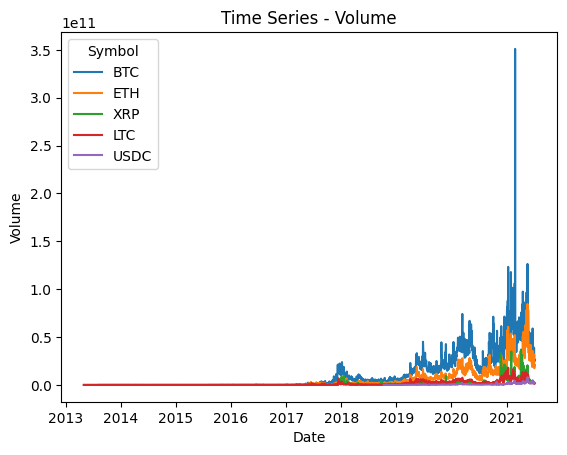

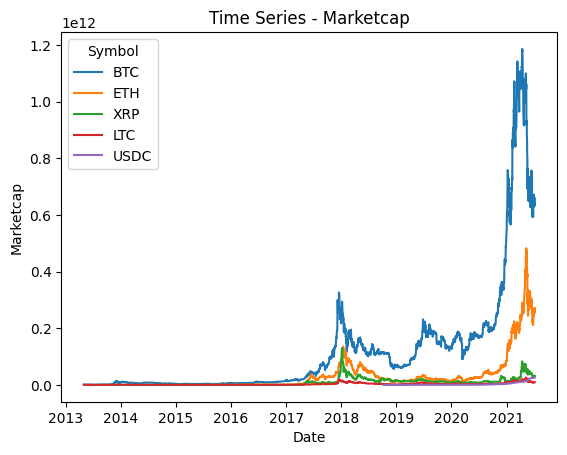

In [28]:

# List of columns to visualize
columns_to_visualize = ['High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']

# Loop through each column
for column in columns_to_visualize:
    # Set up the plot for the current column
    sns.lineplot(data=df_visual, x='Date', y=column, hue='Symbol')
    
    # Add title and labels
    plt.title(f'Time Series - {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    
    # Display the plot
    plt.show()


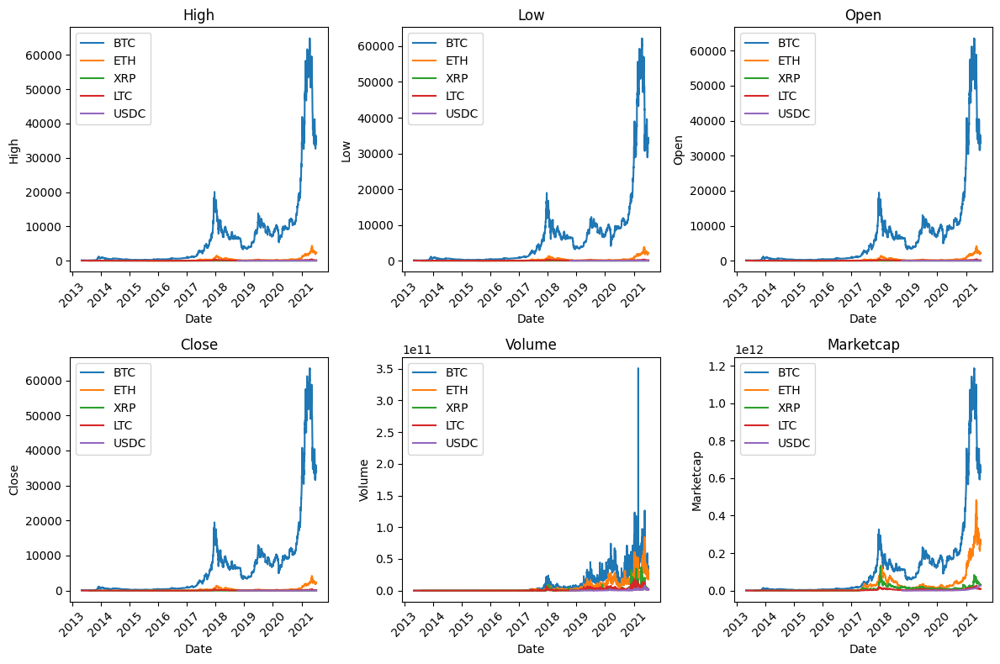

In [29]:
# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Plot the data for each column in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol]
        axs[row, col].plot(data['Date'], data[column], label=symbol)
    
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Date')
    axs[row, col].set_ylabel(column)
    axs[row, col].legend()
    axs[row, col].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


###Visulizing each attribute for selected coins - Box Plot

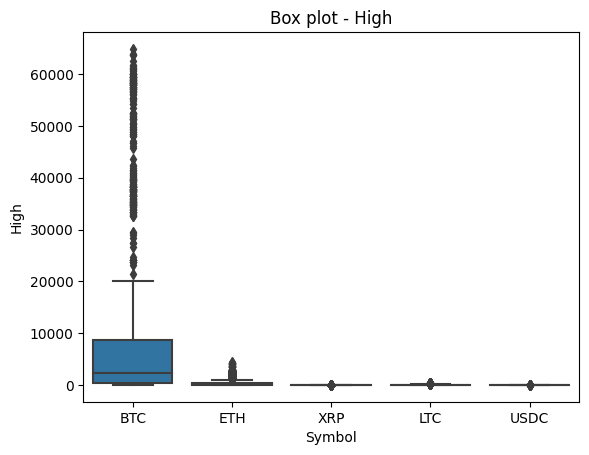

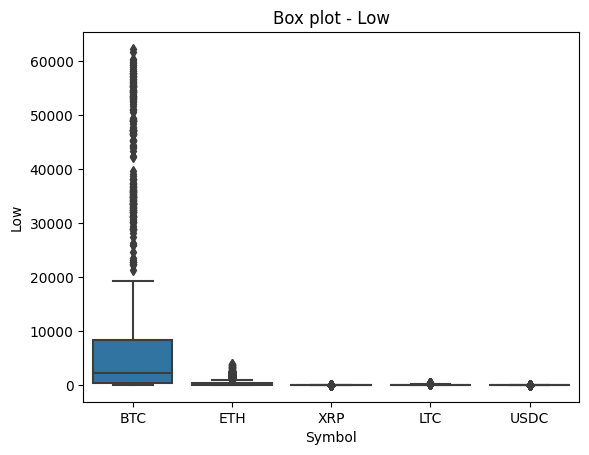

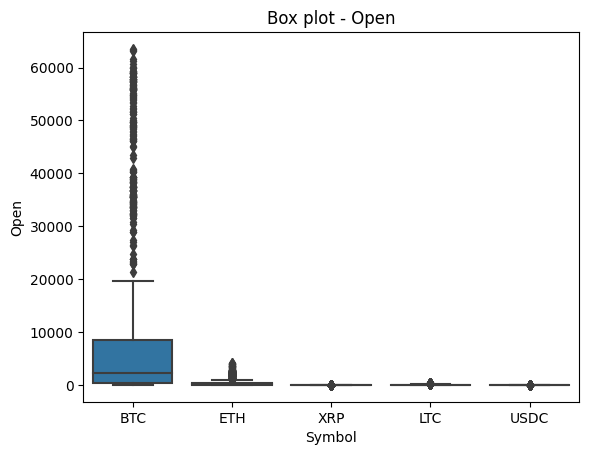

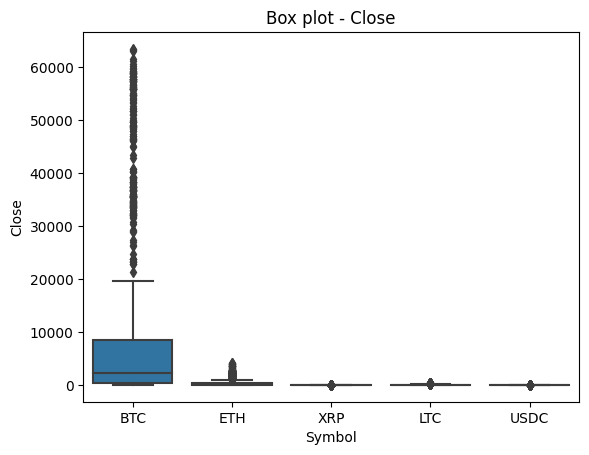

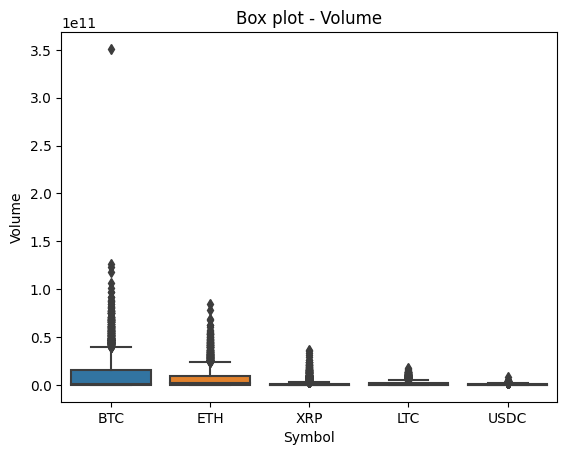

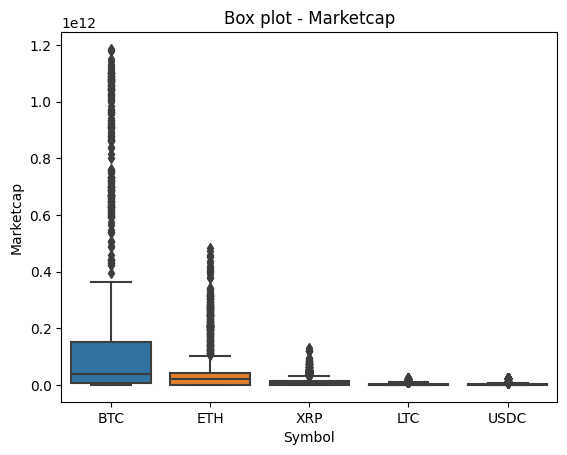

In [30]:

# Loop through each column
for column in columns_to_visualize:
    # Set up the boxplot for the current column
    sns.boxplot(x='Symbol', y=column, data=df_visual)
    
    # Add title and labels
    plt.title(f'Box plot - {column}')
    plt.xlabel('Symbol')
    plt.ylabel(column)
    
    # Display the plot
    plt.show()


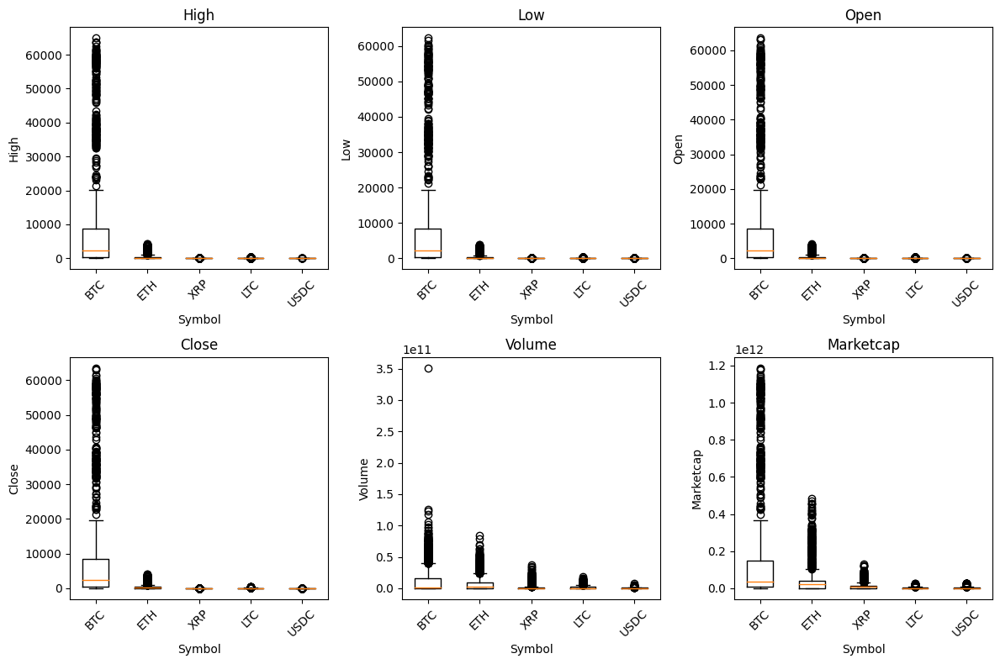

In [31]:
# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Plot the data for each column in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    data_to_plot = []
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol][column]
        data_to_plot.append(data)
    
    axs[row, col].boxplot(data_to_plot, labels=symbols)
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Symbol')
    axs[row, col].set_ylabel(column)
    axs[row, col].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


## Skewness Analysis

In [32]:
import pandas as pd

# Calculate skewness for each coin and column
skewness = df_visual.groupby('Symbol')[columns_to_visualize].skew()

# Display the skewness
print("Skewness:")
print(skewness)


Skewness:
            High       Low      Open     Close    Volume  Marketcap
Symbol                                                             
BTC     3.012925  3.033504  3.025191  3.018634  3.742112   3.071752
ETH     2.982709  2.931693  2.959628  2.948667  2.442103   3.099590
LTC     2.020982  1.907707  1.971091  1.966783  2.610141   2.021090
USDC    2.360479 -1.784938  1.459959  1.498858  2.496024   2.667453
XRP     3.405164  3.012947  3.168133  3.158788  5.141658   2.928928


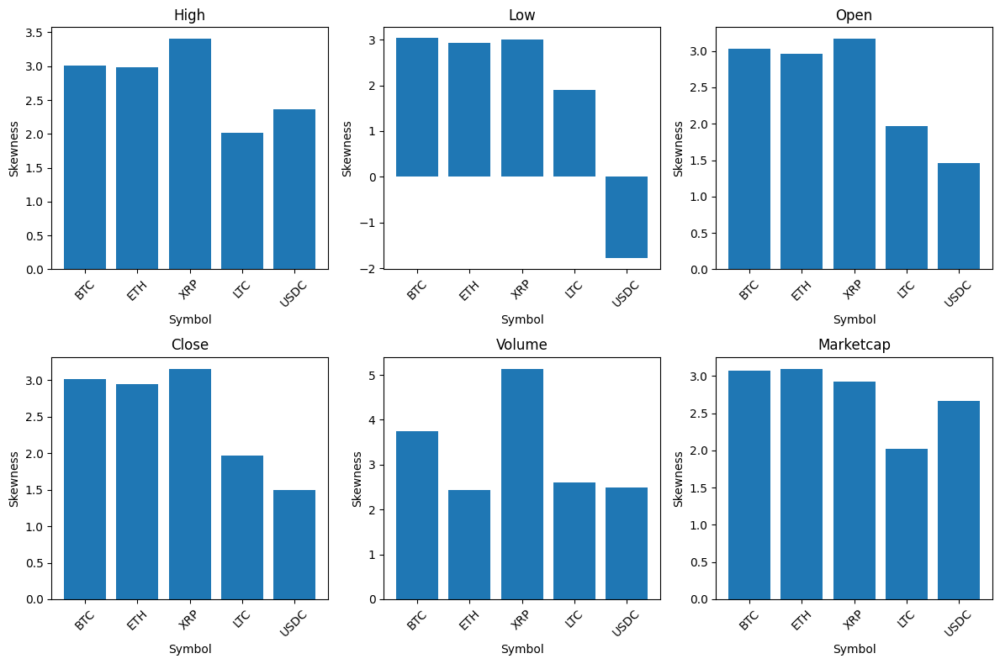

In [33]:
# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Plot the skewness for each column in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    # Get the skewness for each coin
    skewness_values = []
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol][column]
        skewness_value = data.skew()
        skewness_values.append(skewness_value)
    
    axs[row, col].bar(symbols, skewness_values)
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Symbol')
    axs[row, col].set_ylabel('Skewness')
    axs[row, col].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


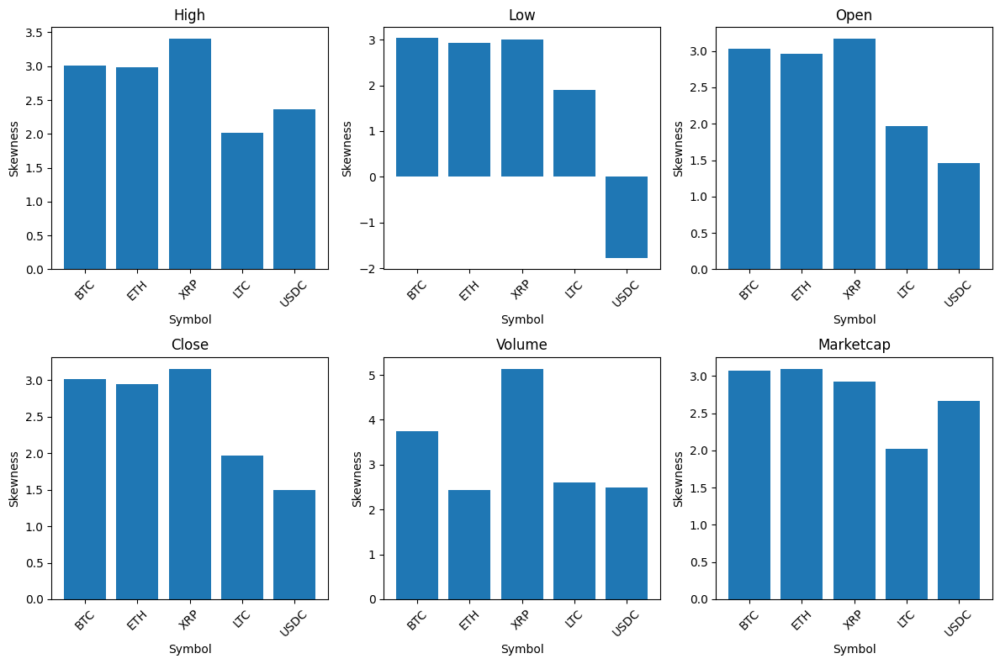

In [34]:
df_visual = df.copy()  # Create a copy of the DataFrame
# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Plot the skewness for each column in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    # Get the skewness for each coin
    skewness_values = []
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol][column]
        skewness_value = data.skew()
        skewness_values.append(skewness_value)
    
    axs[row, col].bar(symbols, skewness_values)
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Symbol')
    axs[row, col].set_ylabel('Skewness')
    axs[row, col].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()



<ipython-input-35-0d6c1c6765d4>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data, shade=True, ax=axs[j // len(columns_to_visualize), i], color='darkblue')
<ipython-input-35-0d6c1c6765d4>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data, shade=True, ax=axs[j // len(columns_to_visualize), i], color='darkblue')
<ipython-input-35-0d6c1c6765d4>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data, shade=True, ax=axs[j // len(columns_to_visualize), i], color='darkblue')
<ipython-input-35-0d6c1c6765d4>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error

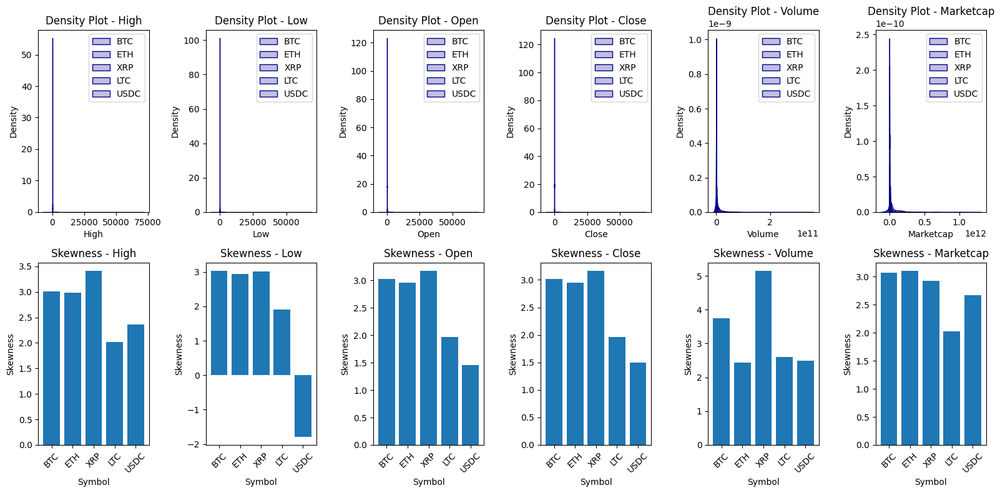

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a list of unique symbols
symbols = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(2, len(columns_to_visualize), figsize=(16, 8))

# Loop through each column
for i, column in enumerate(columns_to_visualize):
    # Plot density for the current column
    for j, symbol in enumerate(symbols):
        data = df_visual[df_visual['Symbol'] == symbol][column]
        sns.kdeplot(data, shade=True, ax=axs[j // len(columns_to_visualize), i], color='darkblue')
    
    # Add title and labels for density plot
    axs[0, i].set_title(f'Density Plot - {column}')
    axs[0, i].set_xlabel(column)
    axs[0, i].set_ylabel('Density')
    axs[0, i].legend(symbols)
    
    # Calculate and plot skewness
    skewness_values = []
    for symbol in symbols:
        data = df_visual[df_visual['Symbol'] == symbol][column]
        skewness_value = data.skew()
        skewness_values.append(skewness_value)
    
    # Plot skewness
    axs[1, i].bar(symbols, skewness_values)
    axs[1, i].set_title(f'Skewness - {column}')
    axs[1, i].set_xlabel('Symbol')
    axs[1, i].set_ylabel('Skewness')
    axs[1, i].tick_params(axis='x', rotation=45)

# Adjust the layout and spacing
plt.tight_layout()

# Show the plots
plt.show()


<ipython-input-36-43bc8c5ac3a4>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(selected_coin_data[column], shade=True, ax=axs[row, col])
<ipython-input-36-43bc8c5ac3a4>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(selected_coin_data[column], shade=True, ax=axs[row, col])
<ipython-input-36-43bc8c5ac3a4>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(selected_coin_data[column], shade=True, ax=axs[row, col])
<ipython-input-36-43bc8c5ac3a4>:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(se

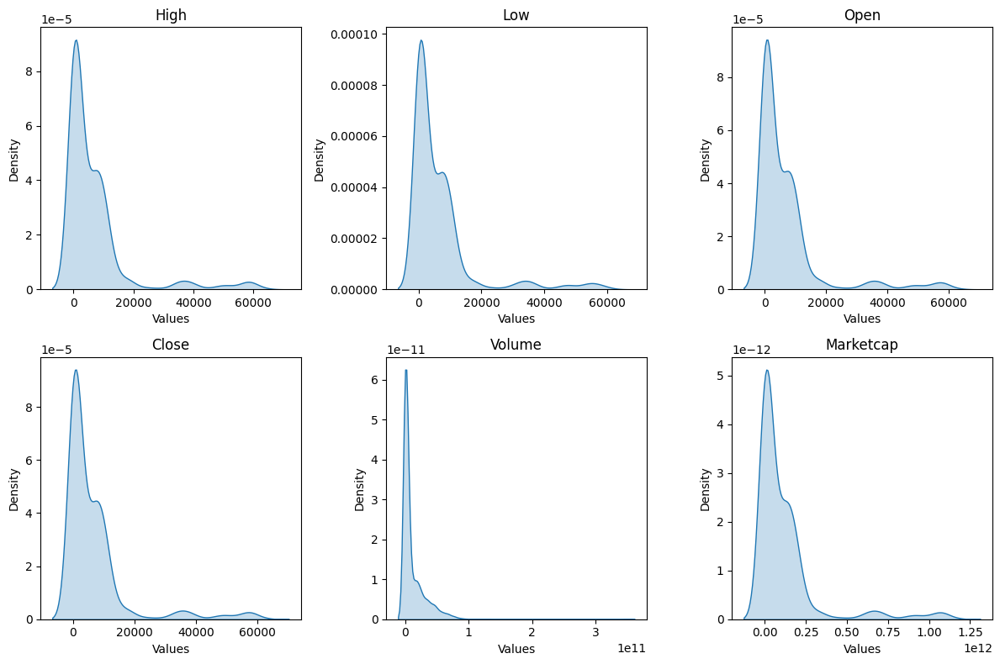

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# Choose the coin for analysis
selected_coin = 'BTC'

# Filter the data for the selected coin
selected_coin_data = df_visual[df_visual['Symbol'] == selected_coin]

# Set up the plot grid
fig, axs = plt.subplots(2, 3, figsize=(12, 8))

# Loop through each column
for i, column in enumerate(columns_to_visualize):
    row, col = i // 3, i % 3
    
    # Plot density for the current column
    sns.kdeplot(selected_coin_data[column], shade=True, ax=axs[row, col])
    
    # Add title and labels
    axs[row, col].set_title(column)
    axs[row, col].set_xlabel('Values')
    axs[row, col].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


###Skewness of each coin for each attribute

<ipython-input-37-b2c4b60f042b>:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(coin_data[column], shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-37-b2c4b60f042b>:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(coin_data[column], shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-37-b2c4b60f042b>:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(coin_data[column], shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-37-b2c4b60f042b>:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabo

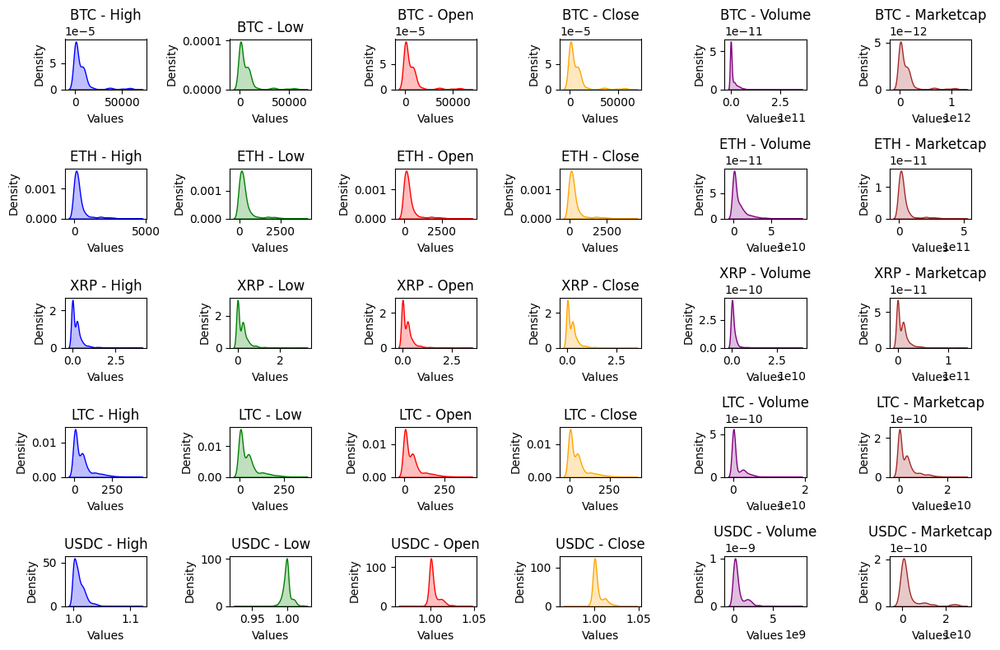

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize), figsize=(12, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Plot density for the current column and coin with the corresponding color
        sns.kdeplot(coin_data[column], shade=True, ax=axs[i, j], color=colors[j % len(colors)])
        
        # Add title and labels
        axs[i, j].set_title(f'{coin} - {column}')
        axs[i, j].set_xlabel('Values')
        axs[i, j].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


In [38]:
import pandas as pd

# Calculate skewness for each column
skewness = df_visual[columns_to_visualize].skew()

# Find the column with the highest skewness
highest_skewness_column = skewness.idxmax()

# Get the highest skewness value
highest_skewness_value = skewness[highest_skewness_column]

# Print the result
print(f"The column with the highest skewness is '{highest_skewness_column}' with a skewness value of {highest_skewness_value:.2f}.")


The column with the highest skewness is 'Low' with a skewness value of 6.27.


In [39]:
import pandas as pd

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Loop through each coin
for coin in coins:
    print(f"Coin: {coin}")
    
    # Filter data for the current coin
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Calculate skewness for each column
    skewness = coin_data[columns_to_visualize].skew()
    
    # Sort the skewness values in descending order
    sorted_skewness = skewness.sort_values(ascending=False)
    
    # Retrieve the column names in descending order of skewness
    columns_sorted_by_skewness = sorted_skewness.index.tolist()
    
    # Print the columns in descending order of skewness
    print("Columns in descending order of skewness:")
    for column in columns_sorted_by_skewness:
        print(column)
    
    print()  # Add a blank line between coins


Coin: BTC
Columns in descending order of skewness:
Volume
Marketcap
Low
Open
Close
High

Coin: ETH
Columns in descending order of skewness:
Marketcap
High
Open
Close
Low
Volume

Coin: XRP
Columns in descending order of skewness:
Volume
High
Open
Close
Low
Marketcap

Coin: LTC
Columns in descending order of skewness:
Volume
Marketcap
High
Open
Close
Low

Coin: USDC
Columns in descending order of skewness:
Marketcap
Volume
High
Close
Open
Low



###Apply the skewness transformations

####Logarithmic Transformation

In [40]:
#Taking the logarithm of the data can help reduce right-skewness (positive skewness). It can be done using functions like np.log or np.log1p (natural logarithm) or np.log10 (base-10 logarithm).

<ipython-input-41-4a4198343e9e>:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-41-4a4198343e9e>:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-41-4a4198343e9e>:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j], color=colors[j % len(colors)])
<ipython-input-41-4a4198343e9e>:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn 

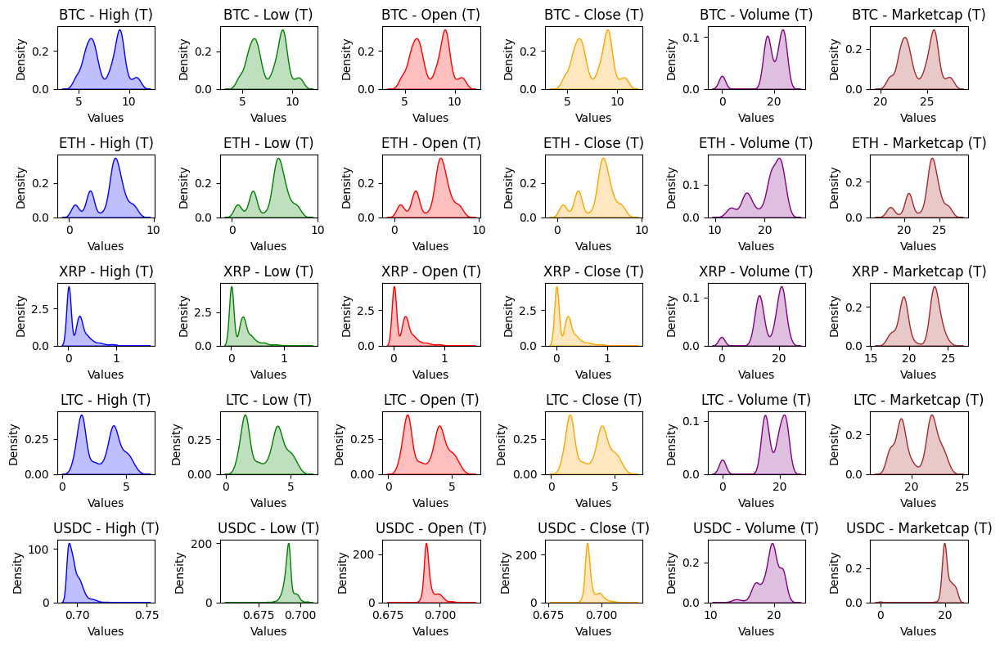

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize), figsize=(12, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Apply the logarithmic transformation to the data
        transformed_data = np.log1p(coin_data[column])
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j], color=colors[j % len(colors)])
        
        # Add title and labels
        axs[i, j].set_title(f'{coin} - {column} (T)')
        axs[i, j].set_xlabel('Values')
        axs[i, j].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


In [42]:
#Now sidewise the original to compare

<ipython-input-43-8238f6494fb7>:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-43-8238f6494fb7>:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-43-8238f6494fb7>:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-43-8238f6494fb7>:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

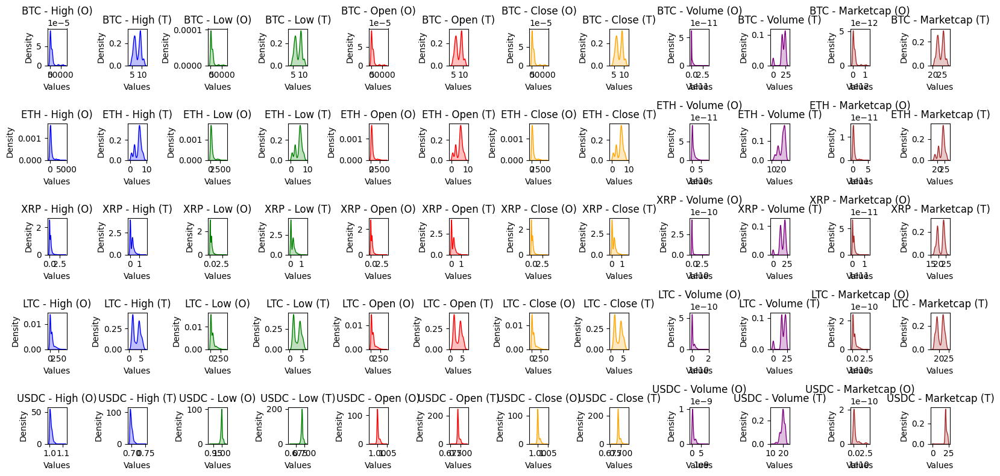

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Apply the logarithmic transformation to the data
        transformed_data = np.log1p(original_data)
        
        # Plot density for the original data
        sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column} (O)')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
        axs[i, j*2+1].set_xlabel('Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Square Root Transformation

In [44]:
#Taking the square root of the data can help reduce right-skewness. It can be done using the np.sqrt function.

<ipython-input-45-586d99960ae0>:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-45-586d99960ae0>:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-45-586d99960ae0>:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-45-586d99960ae0>:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

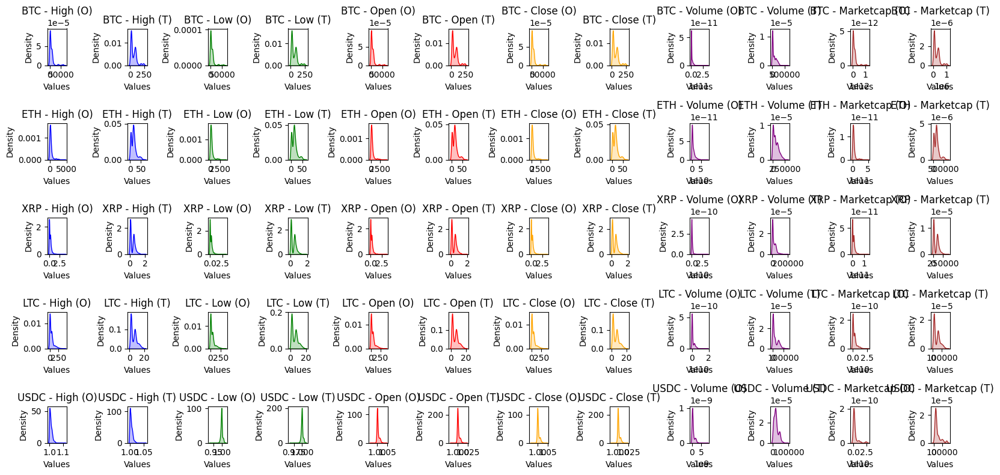

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Apply the square root transformation to the data
        transformed_data = np.sqrt(original_data)
        
        # Plot density for the original data
        sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column} (O)')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
        axs[i, j*2+1].set_xlabel('Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Box-Cox Transformation


In [46]:
#The Box-Cox transformation is a more generalized method that can handle both positive and negative skewness. It uses a power transformation parameter (lambda) to adjust the data distribution. The optimal lambda value is determined using statistical techniques.

<ipython-input-47-50e9e65183cd>:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-47-50e9e65183cd>:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-47-50e9e65183cd>:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-47-50e9e65183cd>:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

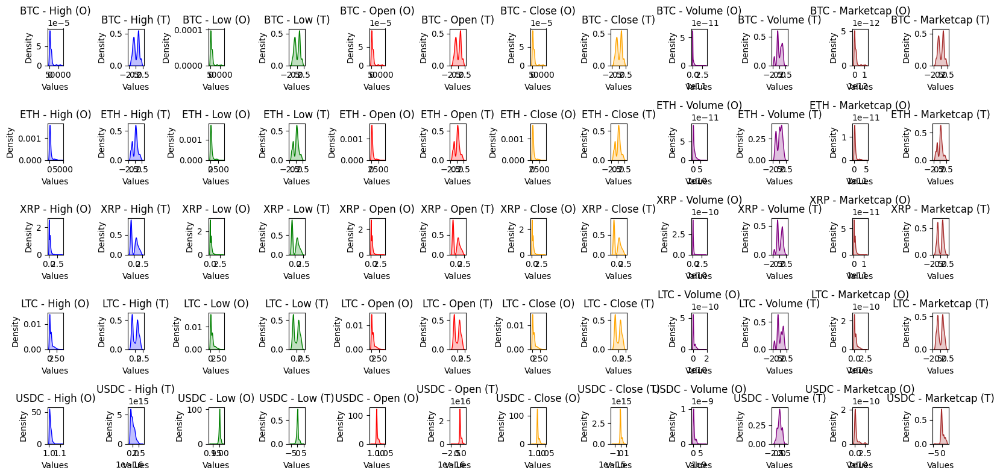

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import PowerTransformer

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Exclude columns with negative values
        if original_data.min() >= 0:
            # Apply the Yeo-Johnson transformation to the data
            transformer = PowerTransformer(method='yeo-johnson')
            transformed_data = transformer.fit_transform(original_data.values.reshape(-1, 1))
            transformed_data = transformed_data.flatten()
            
            # Plot density for the original data
            sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
            axs[i, j*2].set_title(f'{coin} - {column} (O)')
            axs[i, j*2].set_xlabel('Values')
            axs[i, j*2].set_ylabel('Density')
            
            # Plot density for the transformed data
            sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
            axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
            axs[i, j*2+1].set_xlabel('Values')
            axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Reciprocal Transformation



In [48]:
#Taking the reciprocal (1/x) of the data can help reduce left-skewness (negative skewness).

<ipython-input-49-fc23af5fbc54>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-49-fc23af5fbc54>:32: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-49-fc23af5fbc54>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-49-fc23af5fbc54>:32: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

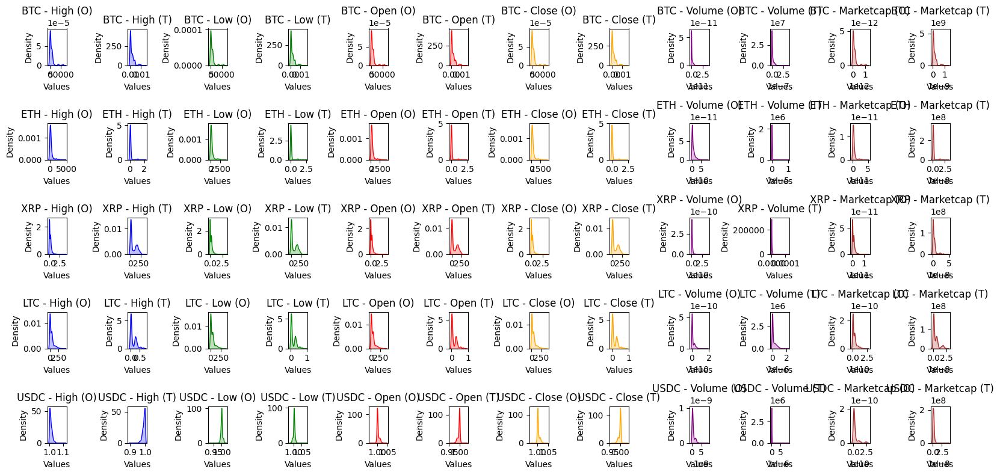

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Apply the reciprocal transformation to the data
        transformed_data = 1 / original_data
        
        # Plot density for the original data
        sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column} (O)')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
        axs[i, j*2+1].set_xlabel('Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Yeo-Johnson Transformation

In [50]:
#Similar to the Box-Cox transformation, the Yeo-Johnson transformation is a power transformation that can handle both positive and negative skewness. It provides more flexibility by allowing for the transformation of zero and negative values.

<ipython-input-51-1fe78f55a88a>:29: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-51-1fe78f55a88a>:35: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
<ipython-input-51-1fe78f55a88a>:29: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
<ipython-input-51-1fe78f55a88a>:35: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seabor

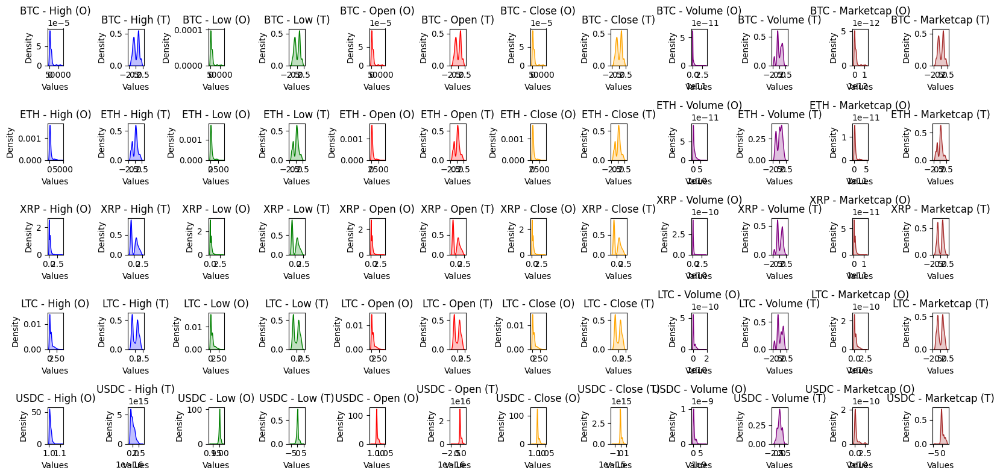

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import PowerTransformer

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]
        
        # Apply the Yeo-Johnson transformation to the data
        transformer = PowerTransformer(method='yeo-johnson')
        transformed_data = transformer.fit_transform(original_data.values.reshape(-1, 1))
        transformed_data = transformed_data.flatten()
        
        # Plot density for the original data
        sns.kdeplot(original_data, shade=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column} (O)')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')
        
        # Plot density for the transformed data
        sns.kdeplot(transformed_data, shade=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column} (T)')
        axs[i, j*2+1].set_xlabel('Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####All Transformations sidewise

<ipython-input-52-c41bf16b2614>:52: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])
<ipython-input-52-c41bf16b2614>:70: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


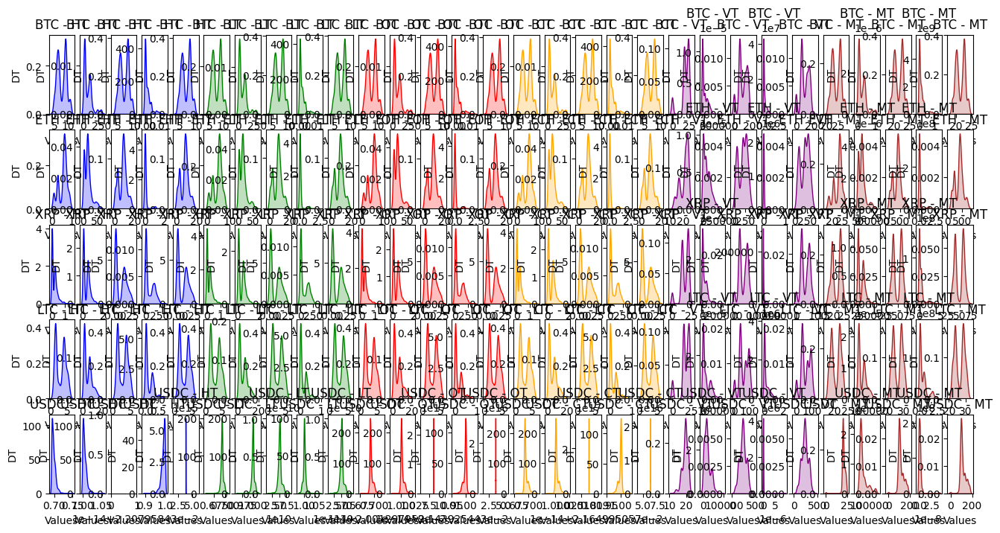

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 5, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]

        # Logarithmic transformation
        log_transformed_data = np.log1p(original_data)

        # Square root transformation
        sqrt_transformed_data = np.sqrt(original_data)

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Reciprocal transformation
        reciprocal_transformed_data = 1 / original_data

        # Yeo-Johnson transformation
        yeojohnson_transformed_data, _ = stats.yeojohnson(original_data)

        # Plot density for the logarithmic transformed data
        sns.kdeplot(log_transformed_data, fill=True, ax=axs[i, j*5], color=colors[j % len(colors)])
        axs[i, j*5].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5].set_xlabel('Values')
        axs[i, j*5].set_ylabel('DT')

        # Plot density for the square root transformed data
        sns.kdeplot(sqrt_transformed_data, fill=True, ax=axs[i, j*5+1], color=colors[j % len(colors)])
        axs[i, j*5+1].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+1].set_xlabel('Values')
        axs[i, j*5+1].set_ylabel('DT')

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])
        axs[i, j*5+2].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+2].set_xlabel('Values')
        axs[i, j*5+2].set_ylabel('DT')

        # Plot density for the reciprocal transformed data
        sns.kdeplot(reciprocal_transformed_data, fill=True, ax=axs[i, j*5+3], color=colors[j % len(colors)])
        axs[i, j*5+3].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+3].set_xlabel('Values')
        axs[i, j*5+3].set_ylabel('DT')

        # Plot density for the Yeo-Johnson transformed data
        sns.kdeplot(yeojohnson_transformed_data, fill=True, ax=axs[i, j*5+4], color=colors[j % len(colors)])
        axs[i, j*5+4].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+4].set_xlabel('Values')
        axs[i, j*5+4].set_ylabel('DT')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


#####Removing the labels to visualize

<ipython-input-53-4e1d44754c8d>:52: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])


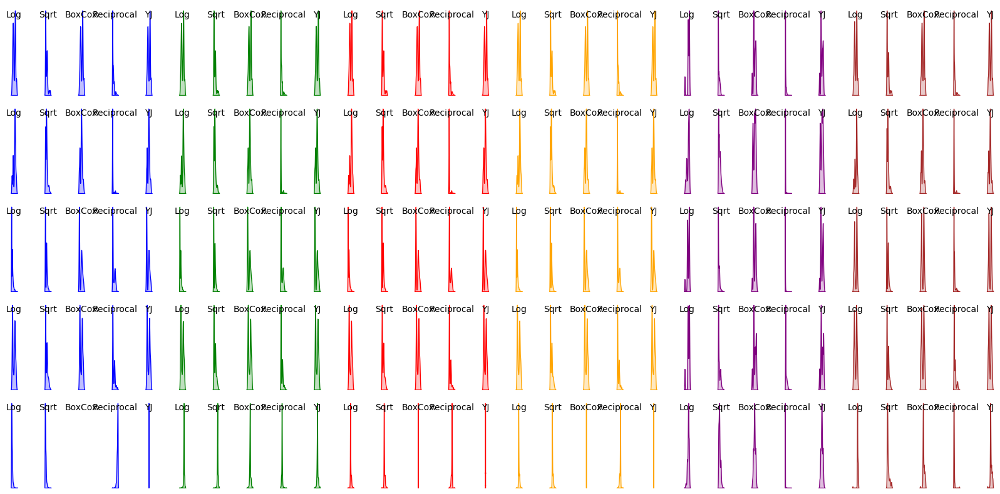

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 5, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]

        # Logarithmic transformation
        log_transformed_data = np.log1p(original_data)

        # Square root transformation
        sqrt_transformed_data = np.sqrt(original_data)

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Reciprocal transformation
        reciprocal_transformed_data = 1 / original_data

        # Yeo-Johnson transformation
        yeojohnson_transformed_data, _ = stats.yeojohnson(original_data)

        # Plot density for the logarithmic transformed data
        sns.kdeplot(log_transformed_data, fill=True, ax=axs[i, j*5], color=colors[j % len(colors)])
        axs[i, j*5].text(0.5, 0.9, 'Log', horizontalalignment='center', verticalalignment='center',
                         transform=axs[i, j*5].transAxes)
        axs[i, j*5].axis('off')

        # Plot density for the square root transformed data
        sns.kdeplot(sqrt_transformed_data, fill=True, ax=axs[i, j*5+1], color=colors[j % len(colors)])
        axs[i, j*5+1].text(0.5, 0.9, 'Sqrt', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*5+1].transAxes)
        axs[i, j*5+1].axis('off')

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])
        axs[i, j*5+2].text(0.5, 0.9, 'BoxCox', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*5+2].transAxes)
        axs[i, j*5+2].axis('off')

        # Plot density for the reciprocal transformed data
        sns.kdeplot(reciprocal_transformed_data, fill=True, ax=axs[i, j*5+3], color=colors[j % len(colors)])
        axs[i, j*5+3].text(0.5, 0.9, 'Reciprocal', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*5+3].transAxes)
        axs[i, j*5+3].axis('off')

        # Plot density for the Yeo-Johnson transformed data
        sns.kdeplot(yeojohnson_transformed_data, fill=True, ax=axs[i, j*5+4], color=colors[j % len(colors)])
        axs[i, j*5+4].text(0.5, 0.9, 'YJ', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*5+4].transAxes)
        axs[i, j*5+4].axis('off')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()



In [54]:
#Based on the density plots generated for each transformation, it appears that the Box-Cox Transformation (BoxCox) and the Yeo-Johnson Transformation (YJ) have effectively reduced the skewness in the data.

#Both methods are capable of handling both positive and negative skewness and provide more flexibility in transforming the data distribution. They adjust the data using a power transformation parameter to achieve a more symmetric and normal-like distribution.

#You can compare the density plots of the transformed data for both the BoxCox and YJ methods and choose the one that appears to have the most balanced and symmetric distribution, indicating reduced skewness.

####Chose the two transformations which effectively reduced the skewness

<ipython-input-55-91373e4aaac9>:31: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*2], color=colors[j % len(colors)])


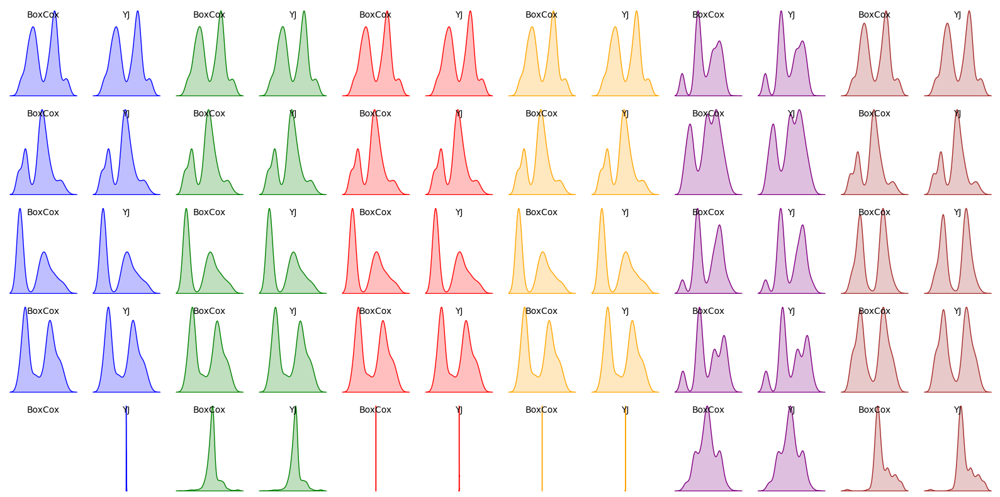

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), len(columns_to_visualize) * 2, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(columns_to_visualize):
        # Original data
        original_data = coin_data[column]

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Yeo-Johnson transformation
        yeojohnson_transformed_data, _ = stats.yeojohnson(original_data)

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].text(0.5, 0.9, 'BoxCox', horizontalalignment='center', verticalalignment='center',
                         transform=axs[i, j*2].transAxes)
        axs[i, j*2].axis('off')

        # Plot density for the Yeo-Johnson transformed data
        sns.kdeplot(yeojohnson_transformed_data, fill=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].text(0.5, 0.9, 'YJ', horizontalalignment='center', verticalalignment='center',
                           transform=axs[i, j*2+1].transAxes)
        axs[i, j*2+1].axis('off')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


###Correlation of columns_to_visualize

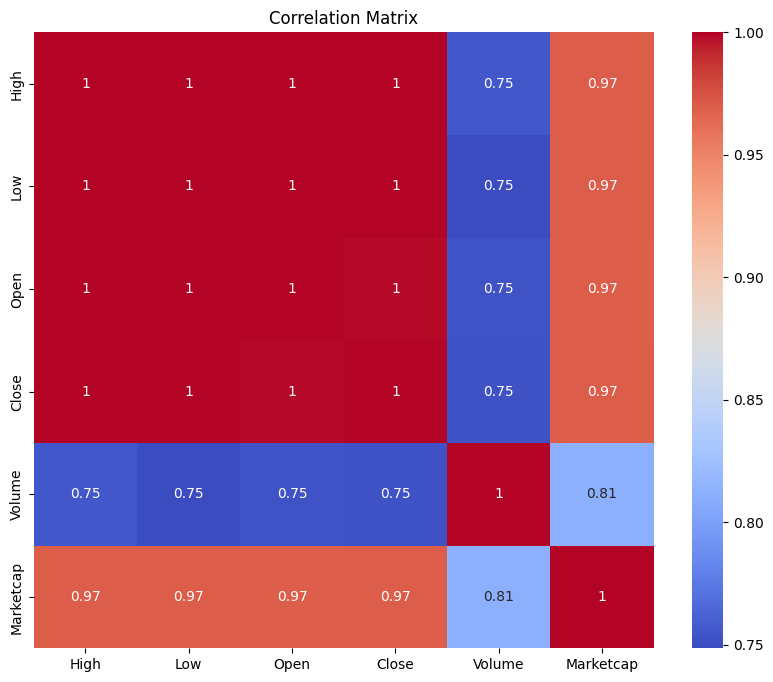

In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'df' with your data
# and a list called 'columns_to_visualize' with the columns to analyze

# Subset the DataFrame with the columns to visualize
subset_df = df[columns_to_visualize]

# Compute the correlation matrix
correlation_matrix = subset_df.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [57]:
#High- Open - Low- Close are highly correlated so closing Close only

####Apply the transformations on reduced attributes

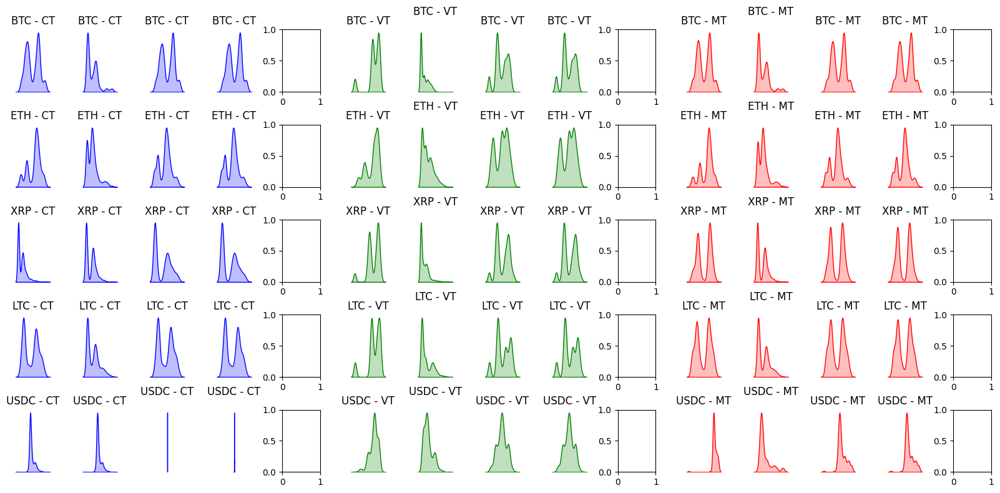

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 15, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(['Close', 'Volume', 'Marketcap']):
        # Original data
        original_data = coin_data[column]

        # Logarithmic transformation
        log_transformed_data = np.log1p(original_data)

        # Square root transformation
        sqrt_transformed_data = np.sqrt(original_data)

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Yeo-Johnson transformation
        yeojohnson_transformed_data, _ = stats.yeojohnson(original_data)

        # Plot density for the logarithmic transformed data
        sns.kdeplot(log_transformed_data, fill=True, ax=axs[i, j*5], color=colors[j % len(colors)])
        axs[i, j*5].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5].set_xlabel('')
        axs[i, j*5].set_ylabel('DT')
        axs[i, j*5].axis('off')

        # Plot density for the square root transformed data
        sns.kdeplot(sqrt_transformed_data, fill=True, ax=axs[i, j*5+1], color=colors[j % len(colors)])
        axs[i, j*5+1].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+1].set_xlabel('')
        axs[i, j*5+1].set_ylabel('DT')
        axs[i, j*5+1].axis('off')

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*5+2], color=colors[j % len(colors)])
        axs[i, j*5+2].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+2].set_xlabel('')
        axs[i, j*5+2].set_ylabel('DT')
        axs[i, j*5+2].axis('off')

        # Plot density for the Yeo-Johnson transformed data
        sns.kdeplot(yeojohnson_transformed_data, fill=True, ax=axs[i, j*5+3], color=colors[j % len(colors)])
        axs[i, j*5+3].set_title(f'{coin} - {column[0]}T')
        axs[i, j*5+3].set_xlabel('')
        axs[i, j*5+3].set_ylabel('DT')
        axs[i, j*5+3].axis('off')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Results based on above transformations

In [59]:
#Based on the provided density plots, we can make some observations about the effectiveness of each transformation method in reducing skewness for the 'Close', 'Volume', and 'Marketcap' attributes:

#For the 'Close' attribute:
#- The Box-Cox transformation (CT) appears to be the most effective in reducing skewness for most coins, as it results in distributions that are closer to a symmetrical shape.
#- The Yeo-Johnson transformation (YT) also shows some improvement in reducing skewness, but it is not as consistent as the Box-Cox transformation.

#For the 'Volume' attribute:
#- The Box-Cox transformation (CT) and the Yeo-Johnson transformation (YT) both show similar effectiveness in reducing skewness, with slightly different results for different coins.

#For the 'Marketcap' attribute:
#- The Box-Cox transformation (CT) and the Yeo-Johnson transformation (YT) again show similar effectiveness in reducing skewness, with some variations for different coins.

#Based on these observations, it seems that the Box-Cox transformation (CT) generally performs well in reducing skewness for the given attributes. However, the choice of the best transformation method may vary depending on the specific coin and attribute being analyzed. It is recommended to further investigate the transformed distributions and consider other factors before making a definitive conclusion on the best transformation method for skewness reduction.

####Box-Cox transformation (CT) for the 'Close', 'Volume', and 'Marketcap' attributes.

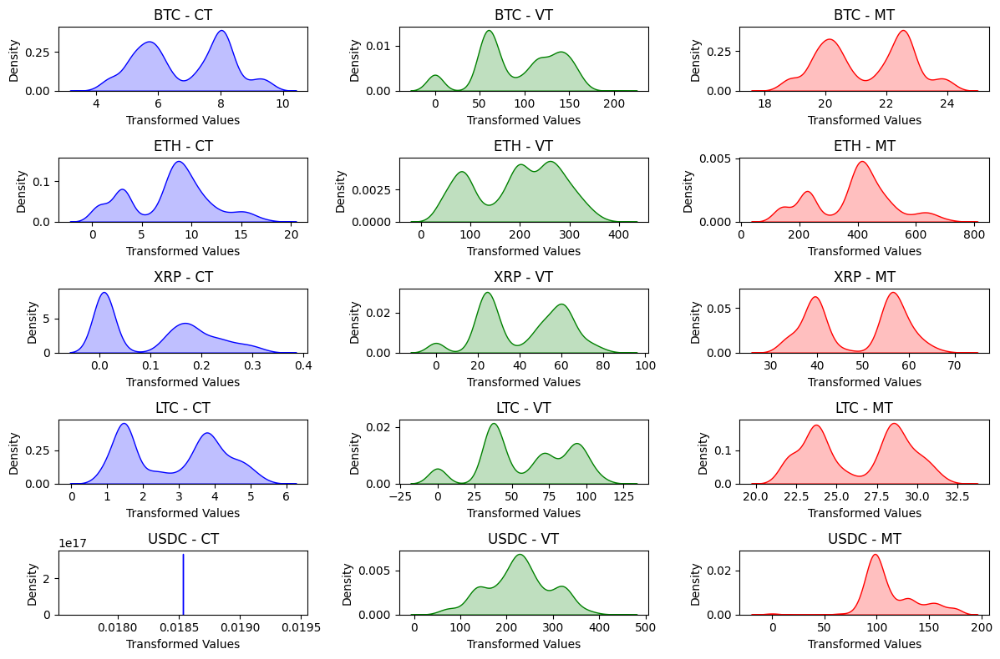

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 3, figsize=(12, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(['Close', 'Volume', 'Marketcap']):
        # Original data
        original_data = coin_data[column]

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j], color=colors[j % len(colors)])
        axs[i, j].set_title(f'{coin} - {column[0]}T')
        axs[i, j].set_xlabel('Transformed Values')
        axs[i, j].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


####Box-Cox transformation (CT) for the 'Close', 'Volume', and 'Marketcap' attributes- Original Vs Transformed

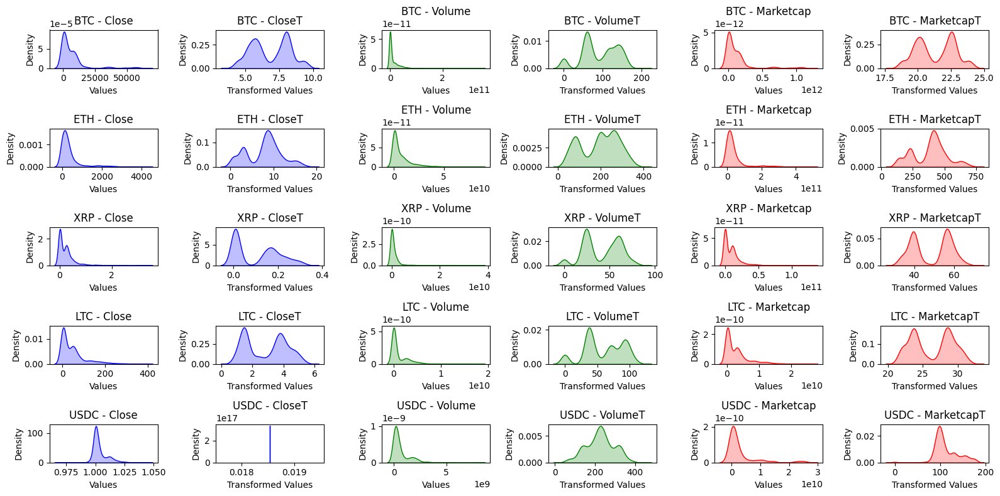

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 6, figsize=(16, 8))

# Define a list of colors for the density plots
colors = ['blue', 'green', 'red']

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Loop through each column
    for j, column in enumerate(['Close', 'Volume', 'Marketcap']):
        # Original data
        original_data = coin_data[column]

        # Box-Cox transformation
        boxcox_transformed_data, _ = stats.boxcox(original_data + 1)  # Adding 1 to handle zero or negative values

        # Plot density for the original data
        sns.kdeplot(original_data, fill=True, ax=axs[i, j*2], color=colors[j % len(colors)])
        axs[i, j*2].set_title(f'{coin} - {column}')
        axs[i, j*2].set_xlabel('Values')
        axs[i, j*2].set_ylabel('Density')

        # Plot density for the Box-Cox transformed data
        sns.kdeplot(boxcox_transformed_data, fill=True, ax=axs[i, j*2+1], color=colors[j % len(colors)])
        axs[i, j*2+1].set_title(f'{coin} - {column}T')
        axs[i, j*2+1].set_xlabel('Transformed Values')
        axs[i, j*2+1].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


##Univariate Analysis

###To perform univariate analysis for each coin using the attribute "Close"

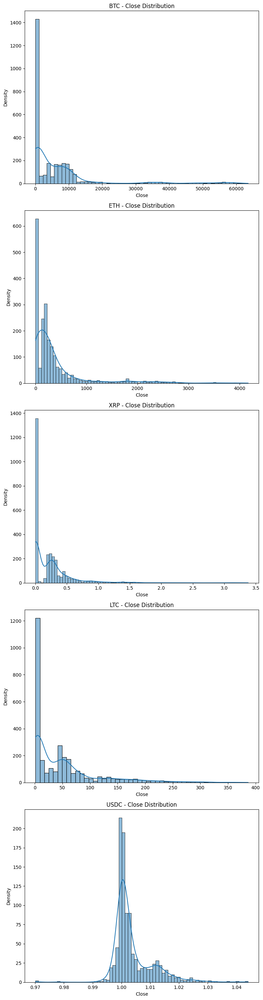

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 1, figsize=(8, 6 * len(coins)))

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]

    # Plot the distribution of 'Close' attribute for the current coin
    sns.histplot(data=coin_data, x='Close', kde=True, ax=axs[i])
    axs[i].set_title(f'{coin} - Close Distribution')
    axs[i].set_xlabel('Close')
    axs[i].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


###To generate univariate analysis for the attributes 'Close', 'Volume', and 'Marketcap' for each coin

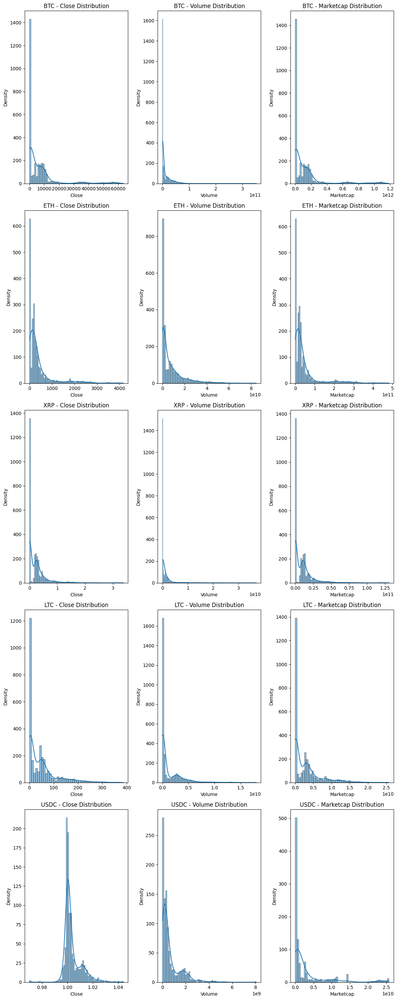

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 3, figsize=(12, 6 * len(coins)))

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]

    # Plot the distribution of 'Close' attribute for the current coin
    sns.histplot(data=coin_data, x='Close', kde=True, ax=axs[i, 0])
    axs[i, 0].set_title(f'{coin} - Close Distribution')
    axs[i, 0].set_xlabel('Close')
    axs[i, 0].set_ylabel('Density')

    # Plot the distribution of 'Volume' attribute for the current coin
    sns.histplot(data=coin_data, x='Volume', kde=True, ax=axs[i, 1])
    axs[i, 1].set_title(f'{coin} - Volume Distribution')
    axs[i, 1].set_xlabel('Volume')
    axs[i, 1].set_ylabel('Density')

    # Plot the distribution of 'Marketcap' attribute for the current coin
    sns.histplot(data=coin_data, x='Marketcap', kde=True, ax=axs[i, 2])
    axs[i, 2].set_title(f'{coin} - Marketcap Distribution')
    axs[i, 2].set_xlabel('Marketcap')
    axs[i, 2].set_ylabel('Density')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


##Bivariate Analysis

###To perform bivariate analysis for the attributes 'Close', 'Volume', and 'Marketcap' for each coin

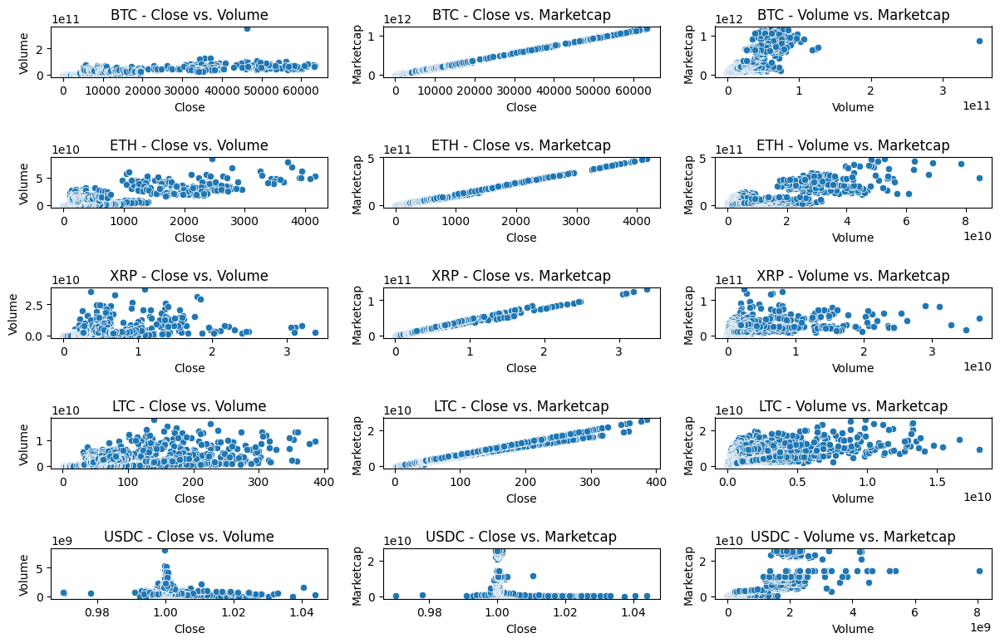

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coins to analyze
coins = df_visual['Symbol'].unique()

# Set up the plot grid
fig, axs = plt.subplots(len(coins), 3, figsize=(12, 8))

# Loop through each coin
for i, coin in enumerate(coins):
    coin_data = df_visual[df_visual['Symbol'] == coin]
    
    # Bivariate analysis for 'Close' and 'Volume'
    sns.scatterplot(x='Close', y='Volume', data=coin_data, ax=axs[i, 0])
    axs[i, 0].set_title(f'{coin} - Close vs. Volume')
    
    # Bivariate analysis for 'Close' and 'Marketcap'
    sns.scatterplot(x='Close', y='Marketcap', data=coin_data, ax=axs[i, 1])
    axs[i, 1].set_title(f'{coin} - Close vs. Marketcap')
    
    # Bivariate analysis for 'Volume' and 'Marketcap'
    sns.scatterplot(x='Volume', y='Marketcap', data=coin_data, ax=axs[i, 2])
    axs[i, 2].set_title(f'{coin} - Volume vs. Marketcap')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()
